# Your Title Here | Recipe's Avarage Rate Prediction

**Name(s)**: Risa Kuriyama

**Website Link**: https://imrisa.github.io/data_analysis/

In [1]:
import pandas as pd
import numpy as np
from pathlib import Path
from ast import literal_eval

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.subplots as sp
from plotly.graph_objects import Scatter
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error

from sklearn.linear_model import LinearRegression, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler, QuantileTransformer, PolynomialFeatures


from dsc80_utils import * # Feel free to uncomment and use this.


In [2]:
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

## Introduction

#### Hello

#### Using recipe data 
**1) Import each csv file and take a look at each content for analysis**
 - import raw interaction data (rows: 731927, columns: 5)
     - user_id(int): user id
     - recipe_id(int): recipe id
     - date(time): date that the recipe is reviewed (yyyy-mm-dd)
     - rating(int): rate of the recipe 0-5
     - review(str): review about the recipe

In [3]:
pip install tabulate

Note: you may need to restart the kernel to use updated packages.


In [7]:
file_path_for_ri = '/Users/kuriyamarisa/Desktop/D80/interactions.csv'
interactions = pd.read_csv(file_path_for_ri)
interactions.head(5)

,user_id,recipe_id,date,rating,review
0,1293707,40893,2011-12-21,5,"So simple, so delicious! Great for chilly fall..."
1,126440,85009,2010-02-27,5,I made the Mexican topping and took it to bunk...
2,57222,85009,2011-10-01,5,"Made the cheddar bacon topping, adding a sprin..."
3,124416,120345,2011-08-06,0,"Just an observation, so I will not rate. I fo..."
4,2000192946,120345,2015-05-10,2,This recipe was OVERLY too sweet. I would sta...


 - import raw recipes data (rows: 83782, columns: 12)
     - name(str): recipe name
     - id(int): recipe id
     - minutes(int): time to cook the recipe
     - contributor_id(int): contributor's id
     - submitted(date): date the recipe was submitted
     - tags(str list): Food.com tags for recipe
     - nutrition(str): list contains each nutrition's amount
     - n_steps(int): number of steps in recipe
     - steps(str list): steps to take in the recipe
     - description(str): description about the recipe
     - ingredients(str list): ingredients for the recipe
     - n_ingredients(int): the amount of ingredients

In [8]:
file_path_for_rr = '/Users/kuriyamarisa/Desktop/D80/RAW_recipes.csv'
recipes = pd.read_csv(file_path_for_rr)
recipes.head(5)

,name,id,minutes,contributor_id,...,steps,description,ingredients,n_ingredients
0,1 brownies in the world best ever,333281,40,985201,...,['heat the oven to 350f and arrange the rack i...,"these are the most; chocolatey, moist, rich, d...","['bittersweet chocolate', 'unsalted butter', '...",9
1,1 in canada chocolate chip cookies,453467,45,1848091,...,"['pre-heat oven the 350 degrees f', 'in a mixi...",this is the recipe that we use at my school ca...,"['white sugar', 'brown sugar', 'salt', 'margar...",11
2,412 broccoli casserole,306168,40,50969,...,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9
3,millionaire pound cake,286009,120,461724,...,"['freheat the oven to 300 degrees', 'grease a ...",why a millionaire pound cake? because it's su...,"['butter', 'sugar', 'eggs', 'all-purpose flour...",7
4,2000 meatloaf,475785,90,2202916,...,"['pan fry bacon , and set aside on a paper tow...","ready, set, cook! special edition contest entr...","['meatloaf mixture', 'unsmoked bacon', 'goat c...",13


#### Q: How rating is going to change based on the features? 📈
- The columns I need:
    - rating - this is the main
    - minumtes, n_ingredients, steps, description, review 

 - 

## Data Cleaning and Exploratory Data Analysis
### Data Cleaning
- clean data set:
    - merge both data sets with 'recipe_id' and 'id'
    - replace all nan value with 0 in rating column
    - calculate average rating as a Series and add it to the data set
    - put nutrition column's list element into each separated columns
    - drop unnecessary columns

In [9]:
# # Left merge the recipes and interactions datasets
# merged_data = recipes.merge(interactions, left_on="id", right_on="recipe_id", how="left")


# # Replace all ratings of 0 with np.nan
# merged_data['rating'] = merged_data['rating'].replace(0, np.nan)

# # Calculate the average rating per recipe as a Series
# avg_ratings = merged_data.groupby('recipe_id')['rating'].mean()

# # Add the average rating back to the merged dataset
# merged_data = merged_data.merge(avg_ratings, left_on="recipe_id", right_index=True, how="left", suffixes=('', '_avg'))
# merged_data.rename(columns={"rating_avg": "avg_rating"}, inplace=True)


# # Handle the nutrition column
# # Convert nutrition column from string to list
# merged_data['nutrition'] = merged_data['nutrition'].apply(lambda x: eval(x) if isinstance(x, str) else x)

# # Create separate columns for each nutritional value
# nutrition_cols = ['calories', 'total_fat', 'sugar', 'sodium', 'protein', 'saturated_fat', 'carbohydrates']
# nutrition_data = pd.DataFrame(merged_data['nutrition'].tolist(), columns=nutrition_cols)
# merged_data = pd.concat([merged_data, nutrition_data], axis=1)

# # Drop unnecessary columns
# merged_data = merged_data.drop(columns=['name','id', 'contributor_id', 'submitted', 'tags', 'steps', 'user_id', 'date','nutrition', 'recipe_id', 'sodium', 'saturated_fat'], errors='ignore')



# pd.set_option('display.max_columns', None)
# merged_data.head(5)

# Left merge the recipes and interactions datasets
merged_data = recipes.merge(interactions, left_on="id", right_on="recipe_id", how="left")

# Replace all ratings of 0 with np.nan
merged_data['rating'] = merged_data['rating'].replace(0, np.nan)

# Calculate the average rating per recipe as a Series
avg_ratings = merged_data.groupby('recipe_id')['rating'].mean()

# Add the average rating back to the merged dataset
merged_data = merged_data.merge(avg_ratings, left_on="recipe_id", right_index=True, how="left", suffixes=('', '_avg'))
merged_data.rename(columns={"rating_avg": "avg_rating"}, inplace=True)

# Handle the nutrition column
# Convert nutrition column from string to list using literal_eval for safety
merged_data['nutrition'] = merged_data['nutrition'].apply(lambda x: literal_eval(x) if isinstance(x, str) else x)

# Create separate columns for each nutritional value
nutrition_cols = ['calories', 'total_fat', 'sugar', 'protein', 'carbohydrates']
nutrition_data = pd.DataFrame(merged_data['nutrition'].tolist(), columns=['calories', 'total_fat', 'sugar', 'sodium', 'protein', 'saturated_fat', 'carbohydrates'])

# Drop sodium and saturated_fat columns
nutrition_data = nutrition_data[nutrition_cols]

# Concatenate the scaled nutrition data back to the merged dataset
merged_data = pd.concat([merged_data, nutrition_data], axis=1)

# Define acceptable ranges for correct units
acceptable_ranges = {
    'calories': 1000,        # 1000 kcal
    'total_fat': 50,        # 100 grams
    'sugar': 50,            # 100 grams
    'protein': 200,          # 200 grams
    'carbohydrates': 300     # 300 grams
}

# Filter rows based on acceptable ranges
for col, max_value in acceptable_ranges.items():
    merged_data = merged_data[merged_data[col] <= max_value]

# Set pandas to display all columns when printing
pd.set_option('display.max_columns', None)

# Display the first 5 rows of the processed dataset
merged_data.head(5)


,name,id,minutes,contributor_id,submitted,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients,user_id,recipe_id,date,rating,review,avg_rating,calories,total_fat,sugar,protein,carbohydrates
0,1 brownies in the world best ever,333281,40,985201,2008-10-27,"['60-minutes-or-less', 'time-to-make', 'course...","[138.4, 10.0, 50.0, 3.0, 3.0, 19.0, 6.0]",10,['heat the oven to 350f and arrange the rack i...,"these are the most; chocolatey, moist, rich, d...","['bittersweet chocolate', 'unsalted butter', '...",9,3.87e+05,333281.0,2008-11-19,4.0,"These were pretty good, but took forever to ba...",4.0,138.4,10.0,50.0,3.0,6.0
2,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9,2.98e+04,306168.0,2008-12-31,5.0,This was one of the best broccoli casseroles t...,5.0,194.8,20.0,6.0,22.0,3.0
3,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9,1.20e+06,306168.0,2009-04-13,5.0,I made this for my son's first birthday party ...,5.0,194.8,20.0,6.0,22.0,3.0
4,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9,7.69e+05,306168.0,2013-08-02,5.0,Loved this. Be sure to completely thaw the br...,5.0,194.8,20.0,6.0,22.0,3.0
5,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9,5.21e+05,306168.0,2017-10-17,5.0,"5 stars from my husband and son, my toughest c...",5.0,194.8,20.0,6.0,22.0,3.0


### Univariate Analysis
- Using plotly to show the distribution
 - Plot1: Histgram for the number of ingredients
     - It shows the frequency of the number of ingredients in the data set. 7-8 ingredients are the most.
 - Plot2: Histgram for the rating of recipes
     - It shows the frequency of the rating. Rate 5 is the most in the data set.

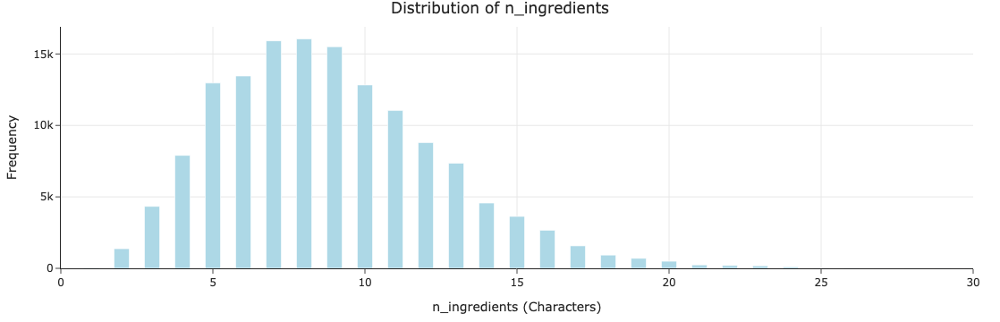

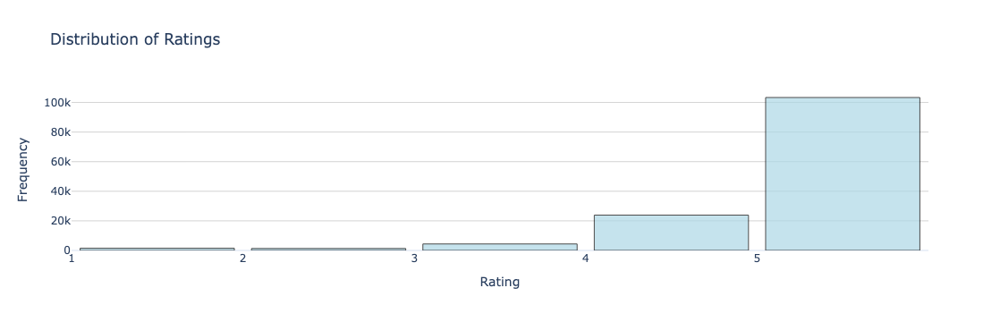

In [10]:
# Plot 1: Plotly Histogram for the Number of ingredients
fig = px.histogram(
    merged_data,
    x='n_ingredients',
    nbins=100,
    title='Distribution of n_ingredients',
    labels={'n_ingredients': 'n_ingredients (Characters)'},
    color_discrete_sequence=['lightblue']
)
fig.update_xaxes(range=[0,30])
fig.update_layout(
    xaxis_title='n_ingredients (Characters)',
    yaxis_title='Frequency',
    title_x=0.5
)
fig.show()

fig.write_html('plot1.html', include_plotlyjs='cdn')



# Plot 2: Matplotlib Histogram for Ratings
# plt.figure(figsize=(6, 4))
# plt.hist(merged_data['rating'], bins=range(0,7), edgecolor='black', alpha=0.7, color='lightblue')
# plt.title('Distribution of Ratings', fontsize=16)
# plt.xlabel('Rating', fontsize=14)
# plt.ylabel('Frequency', fontsize=14)
# plt.xticks(range(0, 6))
# plt.grid(axis='y', linestyle='--', alpha=0.7)
# plt.show()



# Create the histogram
fig = go.Figure()

fig.add_trace(
    go.Histogram(
        x=merged_data['rating'],
        xbins=dict(start=0, end=6, size=1),  # Define bin ranges and size
        marker=dict(color='lightblue', line=dict(color='black', width=1)),
        opacity=0.7
    )
)

# Add title and labels
fig.update_layout(
    title='Distribution of Ratings',
    xaxis_title='Rating',
    yaxis_title='Frequency',
    xaxis=dict(tickmode='array', tickvals=list(range(0, 6))),
    template='plotly_white',
    bargap=0.1
)

# Add gridlines
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey')

# Show the plot
fig.show()

fig.write_html('plot2.html', include_plotlyjs='cdn')

In [11]:
merged_data.head(5)

,name,id,minutes,contributor_id,submitted,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients,user_id,recipe_id,date,rating,review,avg_rating,calories,total_fat,sugar,protein,carbohydrates
0,1 brownies in the world best ever,333281,40,985201,2008-10-27,"['60-minutes-or-less', 'time-to-make', 'course...","[138.4, 10.0, 50.0, 3.0, 3.0, 19.0, 6.0]",10,['heat the oven to 350f and arrange the rack i...,"these are the most; chocolatey, moist, rich, d...","['bittersweet chocolate', 'unsalted butter', '...",9,3.87e+05,333281.0,2008-11-19,4.0,"These were pretty good, but took forever to ba...",4.0,138.4,10.0,50.0,3.0,6.0
2,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9,2.98e+04,306168.0,2008-12-31,5.0,This was one of the best broccoli casseroles t...,5.0,194.8,20.0,6.0,22.0,3.0
3,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9,1.20e+06,306168.0,2009-04-13,5.0,I made this for my son's first birthday party ...,5.0,194.8,20.0,6.0,22.0,3.0
4,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9,7.69e+05,306168.0,2013-08-02,5.0,Loved this. Be sure to completely thaw the br...,5.0,194.8,20.0,6.0,22.0,3.0
5,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9,5.21e+05,306168.0,2017-10-17,5.0,"5 stars from my husband and son, my toughest c...",5.0,194.8,20.0,6.0,22.0,3.0


### Bivariate Analysis
- Scatter Plot: Rating vs Minutes shows how rating and minits to cook are related each other. Rate 4 and 5 looks like takes more time than others 

- Box Plot: Rating vs Minutes(binned) shows the relationship of the mean. But this boxplot doesn't show correctly

In [ ]:
# MERGED DATA
# Scatter Plot: Rating vs Minutes 
scatter_plot = px.scatter(
    merged_data,
    x='minutes',
    y='rating',
    title='Scatter Plot: Rating vs Minutes',
    labels={'minutes': 'Minutes (Preparation Time)', 'rating': 'Rating'},
    color='rating',  
    color_continuous_scale='Viridis'
)
scatter_plot.update_xaxes(range=[0, 10000])  
scatter_plot.update_yaxes(range=[-1, 6]) 
scatter_plot.update_layout(title_x=0.5)
scatter_plot.show()



scatter_plot.write_html('plot3.html', include_plotlyjs='cdn')



# Box Plot: Rating vs Minutes (Binned) (Matplotlib)
# Create bins for preparation time
merged_data['minutes_binned'] = pd.cut(merged_data['minutes'], bins=[0, 15, 30, 60, 120], labels=['0-15', '15-30', '30-60', '60-120'])

# Group data by binned minutes
grouped_data = [merged_data[merged_data['minutes_binned'] == bin]['rating'].dropna() for bin in merged_data['minutes_binned'].cat.categories]

# Matplotlib Box Plot
plt.figure(figsize=(7, 5))
plt.boxplot(
    grouped_data,
    labels=merged_data['minutes_binned'].cat.categories,
    showmeans=True  # Show the mean as part of the box plot
)
plt.title('Box Plot: Rating vs Minutes (Binned)', fontsize=16)
plt.xlabel('Minutes (Preparation Time)', fontsize=14)
plt.ylabel('Rating', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### Interesting Aggregates
 - Aggragate data
     - groupby the rate and shows average length of description and mitures to take for each rate
       - About description length, there is no specific pattern. Almost every rate has the similar length
       - About average minute, the longest minute has 1 rate and the 2nd longest minutes has 5 rate. For other rate, the average minutes are similar.
 - Pivot table
     - index is the minutes_bin and columns are the rate 0-5, and shows each average description length
       - Almost all minutes bins are the similar length of description, but 60-120min tends to have a little longer descriptions.
       

In [ ]:
# create a new column - description length
merged_data['description_length'] = merged_data['description'].str.len().fillna(0).astype(int)

# Grouped Table: Aggregates by Rating
grouped_table = merged_data.groupby('rating').agg({
    'description_length': 'mean',  # mean length
    'minutes': 'mean'  # number of recipes
}).rename(columns={'description_length': 'avg_description_length', 'minutes': 'avg_minutes'})

# Pivot Table: Aggregates by Binned Minutes and Rating
pivot_table = merged_data.pivot_table(
    index='minutes_binned',
    columns='rating',
    values='description_length',
    aggfunc='mean'
)

# print("Grouped Table:")
# print(grouped_table)
# print("")
# print("Pivot Table:")
# print(pivot_table) 

print("Grouped Table:")
print(grouped_table.head())
print(grouped_table.head().to_markdown(index=True))
print("")
print("Pivot Table:")
print(pivot_table.head())
print(pivot_table.head().to_markdown(index=False))


# check point1

## Assessment of Missingness

### NMAR Analysis
- column [review] - not all people review for the recipe, regardless of how good it is (there are 57 missing)
- column [minutes_binned] - if the recipe takes more than 120min, it will be Nan (there are 24294 mmissing)

### Missingness Dependency
Because of the amount of missingness, for [minutes binned], choose two columns for each to see the dependency if the reason of missingness is NMAR or not.
- column depends on other variable: minutes (p-value is 0.0)
    - reason: If the recipe takes long hours over the set bins, it will be missing values
- column doesn't depend on other variable: rating (p-value is 1.0)
    - reason: Rating and time to take for preparation has no correlation. Rating might be strongly related to other factor.

In [ ]:
merged_data.head(5)

In [ ]:
print(merged_data.isna().sum())

### Check the dependency if the missingness column will be affected by other values

- For minute column (if missing_minutes_binned DOES depend on minute)
  - make a new column ['missing_minutes_binned'] and check the dependency

In [ ]:
merged_data['missing_minutes_binned'] = merged_data['minutes_binned'].isna()
observed_stat = merged_data.groupby('missing_minutes_binned')['minutes'].mean().diff().iloc[-1]
print("Observed Test Statistic (Difference in Means):", observed_stat)

#### Permutation test

In [ ]:
perm_stats = []

for _ in range(1000): 
    shuffled = merged_data['missing_minutes_binned'].sample(frac=1, replace=False).reset_index(drop=True)
    perm_stat = merged_data.groupby(shuffled)['minutes'].mean().diff().iloc[-1]
    perm_stats.append(perm_stat)

# Convert to NumPy array for plotting
perm_stats = np.array(perm_stats)


fig = go.Figure()

# Histogram of permuted statistics
fig.add_trace(go.Histogram(x=perm_stats, nbinsx=30, name='Permutation Stats', opacity=0.75))

# Observed statistic as a vertical line
fig.add_trace(go.Scatter(
    x=[observed_stat, observed_stat],
    y=[0, 50],  # Adjust y-range for clarity
    mode="lines",
    name="Observed Statistic",
    line=dict(color="red", dash="dash")
))

fig.update_layout(
    title="Permutation Test for Dependency on Minutes",
    xaxis_title="Test Statistic (Difference in Means)",
    yaxis_title="Frequency",
    showlegend=True
)

fig.show()

fig.write_html('plot4.html', include_plotlyjs='cdn')


#### Result with p-value

In [1]:
p_value = (np.sum(perm_stats >= observed_stat)) / len(perm_stats)
print("P-value:", p_value)
print('Because of the p-value < 0.05, missing_minute_binned IS depending on minute')

NameError: name 'np' is not defined

#### For rating column (if missing_minutes_binned depends on rate)

In [ ]:
observed_stat = merged_data.groupby('missing_minutes_binned')['rating'].mean().diff().iloc[-1]
print("Observed Test Statistic (Difference in Means):", observed_stat)

#### Permutation test

In [ ]:
perm_stats = []

for _ in range(1000):  # Perform 1000 permutations
    shuffled = merged_data['missing_minutes_binned'].sample(frac=1, replace=False).reset_index(drop=True)
    perm_stat = merged_data.groupby(shuffled)['rating'].mean().diff().iloc[-1]
    perm_stats.append(perm_stat)

perm_stats = np.array(perm_stats)

fig = go.Figure()

# Histogram of permuted statistics
fig.add_trace(go.Histogram(x=perm_stats, nbinsx=30, name='Permutation Stats', opacity=0.75))

# Observed statistic as a vertical line
fig.add_trace(go.Scatter(
    x=[observed_stat, observed_stat],
    y=[0, 50],
    mode="lines",
    name="Observed Statistic",
    line=dict(color="red", dash="dash")
))

fig.update_layout(
    title="Permutation Test for Dependency on Rating",
    xaxis_title="Test Statistic (Difference in Means)",
    yaxis_title="Frequency",
    showlegend=True
)

fig.show()
fig.write_html('plot5.html', include_plotlyjs='cdn')

#### Result with p-value

In [ ]:
p_value = (np.sum(perm_stats >= observed_stat)) / len(perm_stats)
print("P-value:", p_value)
print('Because of the p-value > 0.05, missing_minute_binned is NOT depending on rating')

## Hypothesis Testing

### Q: Does the average rating differ significantly between recipes with short cooking times and long cooking times?
- H0: The average rating for both short and long preparation time for the recipes is the same.
- H1: The average rating for short and long preparation time for the recipe is different.

- Test statistic: Difference in rating between the two groups (short time cooking and long time cooking)
- Significance level: 0.05 (5%)

- pvalue < 0.05 - regect H0. It means that the average rating for short and long preparation time for the recipe is different.

###Justify why these choices are good choices for answering the question you are trying to answer.


In [ ]:
# Create two groups: short and long cooking times
short_cooking = merged_data[merged_data['minutes'] <= 30]['avg_rating'].dropna()
long_cooking = merged_data[merged_data['minutes'] > 30]['avg_rating'].dropna()

# Observed difference in means
observed_diff = short_cooking.mean() - long_cooking.mean()

# Combine the data
combined_ratings = np.concatenate([short_cooking, long_cooking])

# Permutation test
n_permutations = 5000
diffs = []

for _ in range(n_permutations):
    np.random.shuffle(combined_ratings)
    short_perm = combined_ratings[:len(short_cooking)]
    long_perm = combined_ratings[len(short_cooking):]
    diffs.append(short_perm.mean() - long_perm.mean())

# Calculate the p-value
p_value = (np.sum(np.abs(diffs) >= np.abs(observed_diff))) / n_permutations

print(f"Observed Difference: {observed_diff}")
print(f"P-Value: {p_value}")

- pvalue < 0.05 - regect H0. It means that the average rating for short and long preparation time for the recipe is different. 

In [ ]:
plt.hist(diffs, bins=30, alpha=0.7, label='Permutation Differences')
plt.axvline(observed_diff, color='red', linestyle='dashed', linewidth=2, label='Observed Difference')
plt.axvline(-observed_diff, color='red', linestyle='dashed', linewidth=2)
plt.title('Permutation Test for Average Rating Differences')
plt.xlabel('Difference in Means')
plt.ylabel('Frequency')
plt.legend()
plt.show()

fig.write_html('plot6.html', include_plotlyjs='cdn')

## Framing a Prediction Problem

### Q: Predict average ratings of recipes 
    Which columns are the best for the features?
- Prediction type: regression (Linear Regression model)
- y (prediction value): rating
- X (features):
    - minutes - time to cook 
    - n_steps - the number of steps to cook
    - n_ingredients - the number of ingredients
    - nutritions - any specific nutrition (calories, sugar, sodium...etc)

### Justification
- About the time
    - All features need to be known before the rate is stated by the user.
    - User interaction data should be avoided for the feature such as review because this is stated after recipe is published.

## Baseline Model

### Model Description
- Type:
    - Linear Regression model
- Pipleline:
  - Scaler: StandardScaler was used to normalize the quantitative features, ensuring they are on the same scale
  - Regressor: LinearRegression to predict avg_rating
- Peformance:
    - RMSE: to see the accuracy of the prediction line with the error size

### Features
- Features (All Quantitative because of numerical): total fat, and sugar
- Models: 20% for the test for unseen data, 80% for the training
    - Test data set: To see the unbiased estimate of how well the model gereralizes to new data
    - Training data set: To learn the relationship between the features and the target prediction value

In [ ]:
# Relevant columns for the model
features = ['total_fat', 'sugar']
target = 'avg_rating'

# Drop rows with missing values in selected columns
modeling_data = merged_data[features + [target]].dropna()

# Split the data into training and testing subsets
# 20% for the test for unseen data, 80% for the training
X = modeling_data[features]
y = modeling_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline with scaling and regression
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])

# Train the model
pipeline.fit(X_train, y_train)

# Predict and evaluate
predictions = pipeline.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, predictions))

# Print RMSE
print(f"Root Mean Squared Error (RMSE): {rmse}")




# Prepare data for plotting regression lines
mean_sugar = X_test['sugar'].mean()
mean_fat = X_test['total_fat'].mean()

# Generate values for total_fat regression line
fat_range = np.linspace(X_test['total_fat'].min(), X_test['total_fat'].max(), 100)
fat_line = pipeline.predict(np.column_stack((fat_range, np.full_like(fat_range, mean_sugar))))

# Generate values for sugar regression line
sugar_range = np.linspace(X_test['sugar'].min(), X_test['sugar'].max(), 100)
sugar_line = pipeline.predict(np.column_stack((np.full_like(sugar_range, mean_fat), sugar_range)))

# Scatterplot for total_fat
fig_fat = go.Figure()
fig_fat.add_trace(go.Scatter(
    x=X_test['total_fat'], 
    y=y_test, 
    mode='markers', 
    name='Total Fat vs Actual Ratings',
    marker=dict(color='blue', opacity=0.6)
))

fig_fat.add_trace(go.Scatter(
    x=fat_range, 
    y=fat_line, 
    mode='lines', 
    name='Regression Line (Total Fat)',
    line=dict(color='red')
))

fig_fat.update_layout(
    title="Scatterplot for Total Fat with Regression Line",
    xaxis_title="Total Fat",
    yaxis_title="Average Rating",
    legend=dict(yanchor="top", y=0.9, xanchor="right", x=0.95),
    showlegend=True
)

fig_fat.write_html('scatterplot_total_fat.html', include_plotlyjs='cdn')

# Scatterplot for sugar
fig_sugar = go.Figure()
fig_sugar.add_trace(go.Scatter(
    x=X_test['sugar'], 
    y=y_test, 
    mode='markers', 
    name='Sugar vs Actual Ratings',
    marker=dict(color='green', opacity=0.6)
))

fig_sugar.add_trace(go.Scatter(
    x=sugar_range, 
    y=sugar_line, 
    mode='lines', 
    name='Regression Line (Sugar)',
    line=dict(color='orange')
))

fig_sugar.update_layout(
    title="Scatterplot for Sugar with Regression Line",
    xaxis_title="Sugar",
    yaxis_title="Average Rating",
    legend=dict(yanchor="top", y=0.9, xanchor="right", x=0.95),
    showlegend=True
)
fig_fat.show()
fig_sugar.show()


In [ ]:
X = modeling_data[['total_fat', 'sugar']]
y = modeling_data['avg_rating']
model = LinearRegression()
model.fit(X, y)

# Generate grid for regression plane
fat_range = np.linspace(modeling_data['total_fat'].min(), modeling_data['total_fat'].max(), 30)
sugar_range = np.linspace(modeling_data['sugar'].min(), modeling_data['sugar'].max(), 30)
fat_grid, sugar_grid = np.meshgrid(fat_range, sugar_range)

# Flatten grids and predict
plane_pts = pd.DataFrame({
    'total_fat': fat_grid.ravel(),
    'sugar': sugar_grid.ravel()
})
plane_pts['predicted'] = model.predict(plane_pts)

# Scatterplot with Regression Plane
fig = px.scatter_3d(
    modeling_data,
    x='total_fat',
    y='sugar',
    z='avg_rating',
    title="Average Rating vs. Total Fat and Sugar",
    color='avg_rating',
    color_continuous_scale='Blues',
    labels={'total_fat': 'Total Fat (grams)', 'sugar': 'Sugar (grams)'}
)

# Add regression plane
fig.add_trace(go.Surface(
    x=fat_range,
    y=sugar_range,
    z=plane_pts['predicted'].values.reshape(fat_grid.shape),
    colorscale="Viridis",
    opacity=0.7,
    showscale=False
))

# Update layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='Total Fat (grams)',
        yaxis_title='Sugar (grams)',
        zaxis_title='Average Rating',
        zaxis=dict(range=[modeling_data['avg_rating'].min(), modeling_data['avg_rating'].max()]),
    )
)

# Display the plot
fig.show()
fig.write_html('scatterplot_fat_sugar_regression.html', include_plotlyjs='cdn')

## Final Model

### Improvement
- Having different models for the pipeline:
    - StandardScaler: Standardizes numerical features by removing the mean and scaling to unit variance
        - Ensures all features are on the same scale
    - PolynomialFeatures: Generates additional features by computing interactions and powers of existing features (calories * sugar)
        - Capture the non-linear relation and it enhances the model flexibility and the prediciton accuracy.
    - QuantileTransformer: Transforms the data into a normal or uniform distribution.
        - Helps models handle skewed data better by normalizing feature distributions.
      
- Type:
    - RandomForestRegressor: To handle non-linear relation to have more accuracy.

- RMSE is a little bit changed from the previous 0.49 to 0.38
    - standardizes variance makes the prediction easier because all features are closer
    - captured the non-linear relation is crucial because linear regression is robust to the outliner

Root Mean Squared Error (RMSE): 0.3786210124546439


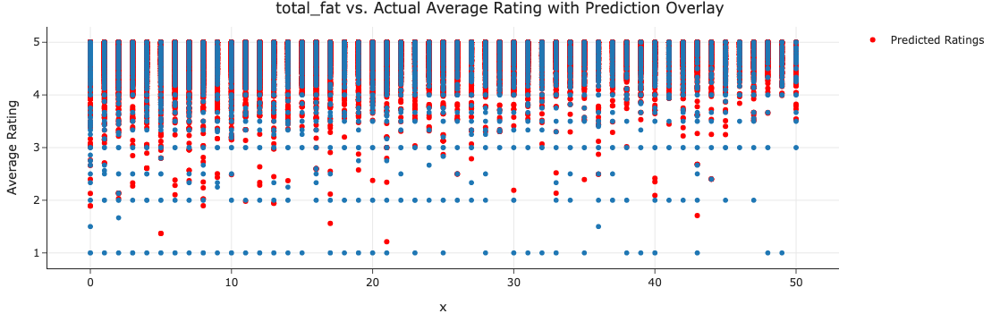

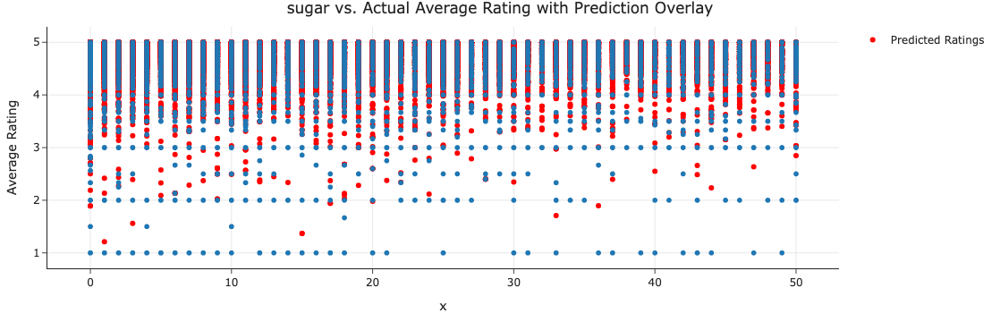

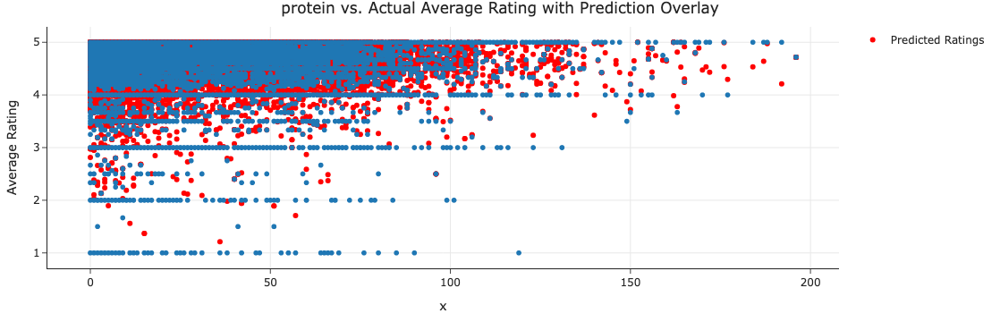

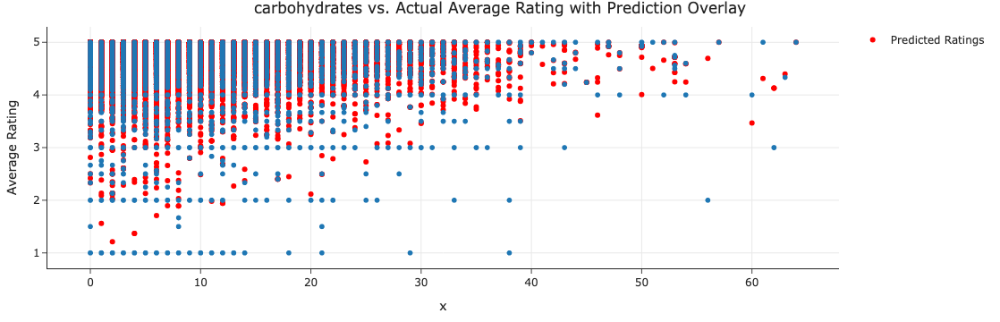

In [6]:
# NEW
import numpy as np
import pandas as pd
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, QuantileTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error

# Relevant columns for the model
features = ['total_fat', 'sugar', 'protein', 'carbohydrates']
target = 'avg_rating'

# Drop rows with missing values in selected columns
modeling_data = merged_data[features + [target]].dropna()

# Split the data into training and testing subsets
X = modeling_data[features]
y = modeling_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline with scaling, polynomial features, quantile transformation, and random forest regression
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('poly_features', PolynomialFeatures(degree=2, include_bias=False)),
    ('quantile_transform', QuantileTransformer(output_distribution='normal', random_state=42)),
    ('regressor', RandomForestRegressor(random_state=42))  # Default parameters
])

# Train the model
pipeline.fit(X_train, y_train)

# Predict and evaluate
predictions = pipeline.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, predictions))
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Visualize scatterplots for each feature
for feature in features:
    # Scatter plot of feature vs. actual avg_rating
    scatter_fig = px.scatter(
        x=X_test[feature],
        y=y_test,
        title=f"{feature} vs. Actual Average Rating with Prediction Overlay",
        labels={feature: feature, 'y': 'Average Rating'}
    )
    
    # Add predicted values as a line
    scatter_fig.add_scatter(
        x=X_test[feature],
        y=predictions,
        mode='markers',
        name='Predicted Ratings',
        marker=dict(color='red', symbol='circle')
    )
    
    # Show the plot
    scatter_fig.show()
    scatter_fig.write_html('scatterplot_carbohydrates_regression.html', include_plotlyjs='cdn')

## Step 8: Fairness Analysis

- Check the fairness about each nutritions(high and low value) in the final model if the samples are fair to get the result of relation between the predict value. 

### Hypothesis
- H0: Our model is fair. Its precision for two groups (high and low), and any differences are due to random chance.
- H1: Our model is unfair. Its precision for two groups (high and low) and any differences are not random chance.

- Result
  - calories: samples are fair between the two groups
  - fat: samples are fair between the two groups
  - sugar: samples are unfair between the two groups. Prediction result might be affected depending on the sample.

In [8]:
# Define groups based on the median value of 'calories'
median_fat = X_test['total_fat'].median()
group_x = X_test[X_test['total_fat'] <= median_fat]
group_y = X_test[X_test['total_fat'] > median_fat]

# Get predictions for each group
predictions_x = pipeline.predict(group_x)
predictions_y = pipeline.predict(group_y)

# Calculate RMSE for each group
rmse_x = np.sqrt(mean_squared_error(y_test.loc[group_x.index], predictions_x))
rmse_y = np.sqrt(mean_squared_error(y_test.loc[group_y.index], predictions_y))

# Observed RMSE difference
observed_difference = abs(rmse_x - rmse_y)
print(f"Observed RMSE Difference: {observed_difference}")

# Permutation test
n_permutations = 100
perm_differences = []

# Combine groups for permutation
combined_data = X_test.copy()
combined_data['group'] = np.where(combined_data['total_fat'] <= median_fat, 'X', 'Y')

for _ in range(n_permutations):
    # Shuffle group labels
    shuffled_labels = np.random.permutation(combined_data['group'])
    combined_data['shuffled_group'] = shuffled_labels

    # Split data into shuffled groups
    shuffled_x = combined_data[combined_data['shuffled_group'] == 'X']
    shuffled_y = combined_data[combined_data['shuffled_group'] == 'Y']

    # Compute RMSE for shuffled groups
    perm_predictions_x = pipeline.predict(shuffled_x[features])
    perm_predictions_y = pipeline.predict(shuffled_y[features])

    perm_rmse_x = np.sqrt(mean_squared_error(y_test.loc[shuffled_x.index], perm_predictions_x))
    perm_rmse_y = np.sqrt(mean_squared_error(y_test.loc[shuffled_y.index], perm_predictions_y))

    # Append absolute RMSE difference
    perm_differences.append(abs(perm_rmse_x - perm_rmse_y))

# Calculate p-value
p_value = np.mean([diff >= observed_difference for diff in perm_differences])
print(f"P-value: {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The model's RMSE differs significantly between the two groups.")
else:
    print("Fail to reject the null hypothesis: No significant difference in RMSE between the two groups.")

Observed RMSE Difference: 0.05196006747246118
P-value: 0.0
Reject the null hypothesis: The model's RMSE differs significantly between the two groups.


In [9]:
# Define groups based on the median value of 'calories'
median_sugar = X_test['sugar'].median()
group_x = X_test[X_test['sugar'] <= median_sugar]
group_y = X_test[X_test['sugar'] > median_sugar]

# Get predictions for each group
predictions_x = pipeline.predict(group_x)
predictions_y = pipeline.predict(group_y)

# Calculate RMSE for each group
rmse_x = np.sqrt(mean_squared_error(y_test.loc[group_x.index], predictions_x))
rmse_y = np.sqrt(mean_squared_error(y_test.loc[group_y.index], predictions_y))

# Observed RMSE difference
observed_difference = abs(rmse_x - rmse_y)
print(f"Observed RMSE Difference: {observed_difference}")

# Permutation test
n_permutations = 100
perm_differences = []

# Combine groups for permutation
combined_data = X_test.copy()
combined_data['group'] = np.where(combined_data['sugar'] <= median_sugar, 'X', 'Y')

for _ in range(n_permutations):
    # Shuffle group labels
    shuffled_labels = np.random.permutation(combined_data['group'])
    combined_data['shuffled_group'] = shuffled_labels

    # Split data into shuffled groups
    shuffled_x = combined_data[combined_data['shuffled_group'] == 'X']
    shuffled_y = combined_data[combined_data['shuffled_group'] == 'Y']

    # Compute RMSE for shuffled groups
    perm_predictions_x = pipeline.predict(shuffled_x[features])
    perm_predictions_y = pipeline.predict(shuffled_y[features])

    perm_rmse_x = np.sqrt(mean_squared_error(y_test.loc[shuffled_x.index], perm_predictions_x))
    perm_rmse_y = np.sqrt(mean_squared_error(y_test.loc[shuffled_y.index], perm_predictions_y))

    # Append absolute RMSE difference
    perm_differences.append(abs(perm_rmse_x - perm_rmse_y))

# Calculate p-value
p_value = np.mean([diff >= observed_difference for diff in perm_differences])
print(f"P-value: {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The model's RMSE differs significantly between the two groups.")
else:
    print("Fail to reject the null hypothesis: No significant difference in RMSE between the two groups.")

Observed RMSE Difference: 0.008516514407459153
P-value: 0.52
Fail to reject the null hypothesis: No significant difference in RMSE between the two groups.


In [10]:
# Define groups based on the median value of 'calories'
median_sugar = X_test['protein'].median()
group_x = X_test[X_test['protein'] <= median_sugar]
group_y = X_test[X_test['protein'] > median_sugar]

# Get predictions for each group
predictions_x = pipeline.predict(group_x)
predictions_y = pipeline.predict(group_y)

# Calculate RMSE for each group
rmse_x = np.sqrt(mean_squared_error(y_test.loc[group_x.index], predictions_x))
rmse_y = np.sqrt(mean_squared_error(y_test.loc[group_y.index], predictions_y))

# Observed RMSE difference
observed_difference = abs(rmse_x - rmse_y)
print(f"Observed RMSE Difference: {observed_difference}")

# Permutation test
n_permutations = 100
perm_differences = []

# Combine groups for permutation
combined_data = X_test.copy()
combined_data['group'] = np.where(combined_data['protein'] <= median_sugar, 'X', 'Y')

for _ in range(n_permutations):
    # Shuffle group labels
    shuffled_labels = np.random.permutation(combined_data['group'])
    combined_data['shuffled_group'] = shuffled_labels

    # Split data into shuffled groups
    shuffled_x = combined_data[combined_data['shuffled_group'] == 'X']
    shuffled_y = combined_data[combined_data['shuffled_group'] == 'Y']

    # Compute RMSE for shuffled groups
    perm_predictions_x = pipeline.predict(shuffled_x[features])
    perm_predictions_y = pipeline.predict(shuffled_y[features])

    perm_rmse_x = np.sqrt(mean_squared_error(y_test.loc[shuffled_x.index], perm_predictions_x))
    perm_rmse_y = np.sqrt(mean_squared_error(y_test.loc[shuffled_y.index], perm_predictions_y))

    # Append absolute RMSE difference
    perm_differences.append(abs(perm_rmse_x - perm_rmse_y))

# Calculate p-value
p_value = np.mean([diff >= observed_difference for diff in perm_differences])
print(f"P-value: {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The model's RMSE differs significantly between the two groups.")
else:
    print("Fail to reject the null hypothesis: No significant difference in RMSE between the two groups.")

Observed RMSE Difference: 0.049162329606651456
P-value: 0.0
Reject the null hypothesis: The model's RMSE differs significantly between the two groups.


In [11]:
# Define groups based on the median value of 'calories'
median_sugar = X_test['carbohydrates'].median()
group_x = X_test[X_test['carbohydrates'] <= median_sugar]
group_y = X_test[X_test['carbohydrates'] > median_sugar]

# Get predictions for each group
predictions_x = pipeline.predict(group_x)
predictions_y = pipeline.predict(group_y)

# Calculate RMSE for each group
rmse_x = np.sqrt(mean_squared_error(y_test.loc[group_x.index], predictions_x))
rmse_y = np.sqrt(mean_squared_error(y_test.loc[group_y.index], predictions_y))

# Observed RMSE difference
observed_difference = abs(rmse_x - rmse_y)
print(f"Observed RMSE Difference: {observed_difference}")

# Permutation test
n_permutations = 100
perm_differences = []

# Combine groups for permutation
combined_data = X_test.copy()
combined_data['group'] = np.where(combined_data['carbohydrates'] <= median_sugar, 'X', 'Y')

for _ in range(n_permutations):
    # Shuffle group labels
    shuffled_labels = np.random.permutation(combined_data['group'])
    combined_data['shuffled_group'] = shuffled_labels

    # Split data into shuffled groups
    shuffled_x = combined_data[combined_data['shuffled_group'] == 'X']
    shuffled_y = combined_data[combined_data['shuffled_group'] == 'Y']

    # Compute RMSE for shuffled groups
    perm_predictions_x = pipeline.predict(shuffled_x[features])
    perm_predictions_y = pipeline.predict(shuffled_y[features])

    perm_rmse_x = np.sqrt(mean_squared_error(y_test.loc[shuffled_x.index], perm_predictions_x))
    perm_rmse_y = np.sqrt(mean_squared_error(y_test.loc[shuffled_y.index], perm_predictions_y))

    # Append absolute RMSE difference
    perm_differences.append(abs(perm_rmse_x - perm_rmse_y))

# Calculate p-value
p_value = np.mean([diff >= observed_difference for diff in perm_differences])
print(f"P-value: {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The model's RMSE differs significantly between the two groups.")
else:
    print("Fail to reject the null hypothesis: No significant difference in RMSE between the two groups.")

Observed RMSE Difference: 0.023228975210453806
P-value: 0.08
Fail to reject the null hypothesis: No significant difference in RMSE between the two groups.
